In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
from matplotlib import rcParams
import matplotlib.font_manager
rcParams['font.sans-serif']=['Arial']
sc.settings.set_figure_params(dpi=100, facecolor='white',fontsize=12)

scanpy==1.7.2 anndata==0.7.6 umap==0.4.6 numpy==1.22.4 scipy==1.6.2 pandas==1.5.2 scikit-learn==0.22 statsmodels==0.12.2 python-igraph==0.9.4


In [2]:
adata_pc=sc.read('distal.h5ad')
adata_tal=sc.read('TAL.h5ad')
adata_cod=sc.read('tL.h5ad')

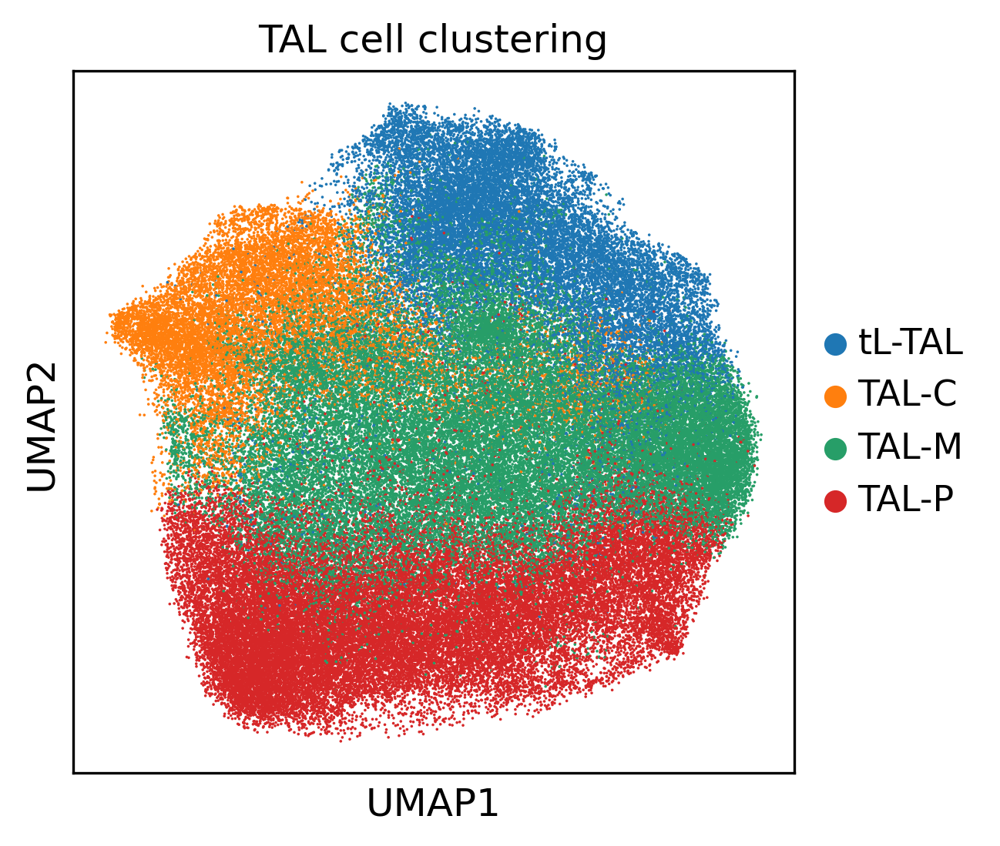

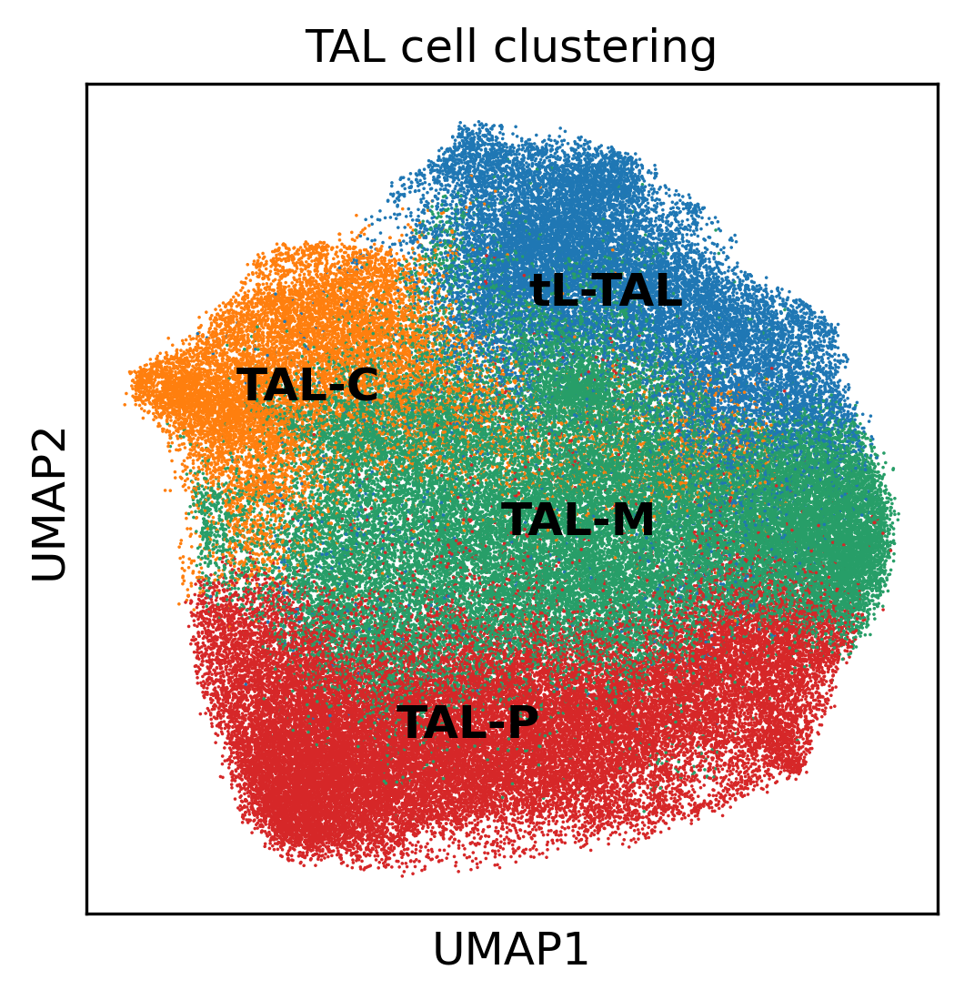

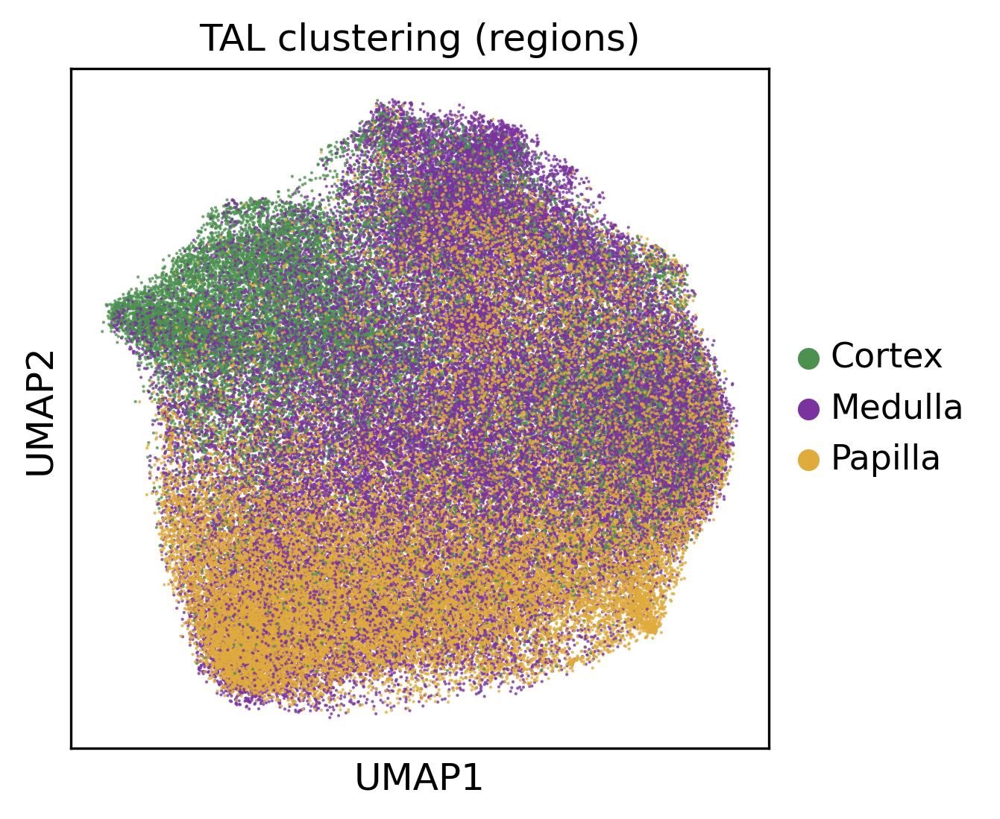

In [15]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=12)
#del adata_tal.uns['celltype_tal_colors']
sc.pl.umap(adata_tal, color=['celltype_tal_2023'],title='TAL cell clustering',size=3)
sc.pl.umap(adata_tal, color=['celltype_tal_2023'],legend_loc='on data',title='TAL cell clustering',size=3)
sc.pl.umap(adata_tal, color=['renal_region_new'],title='TAL clustering (regions)',size=4,alpha=0.8)

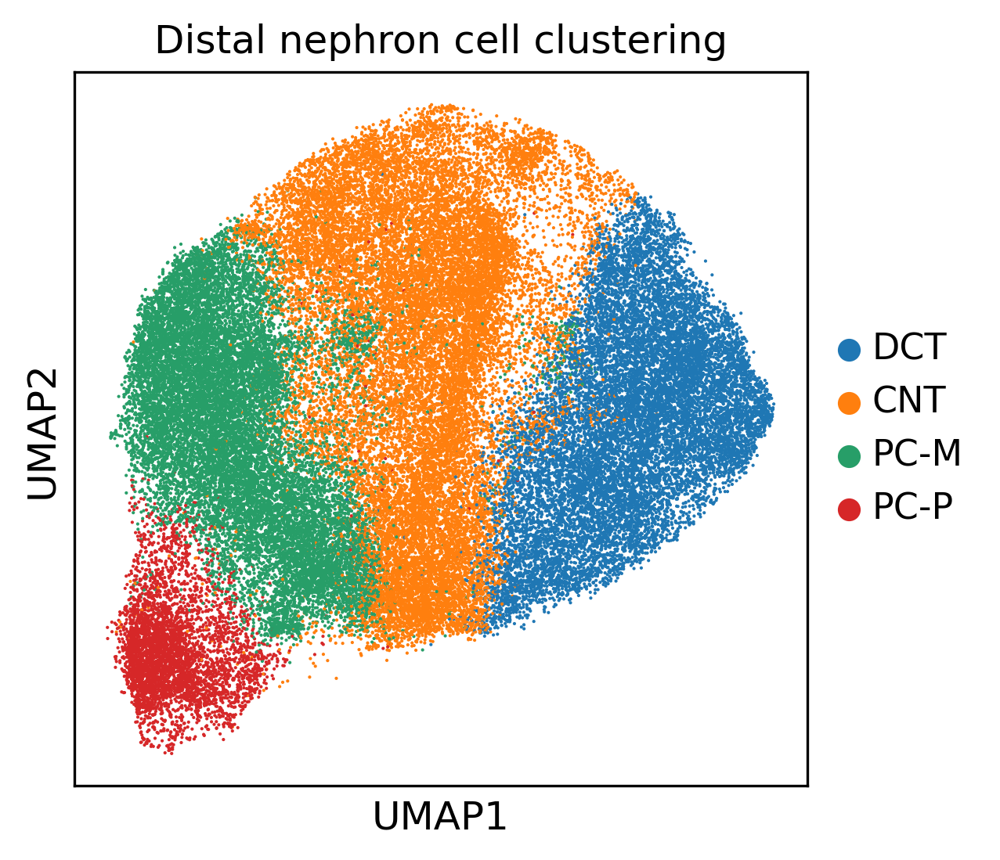

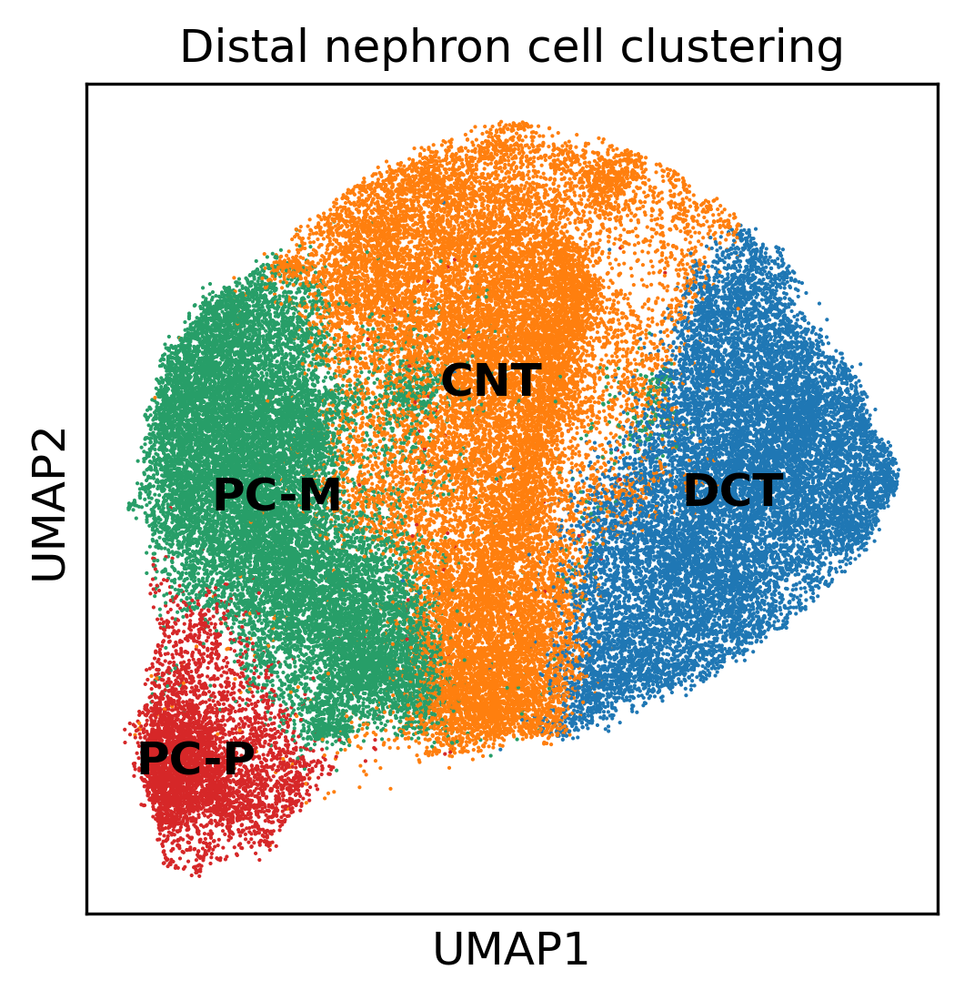

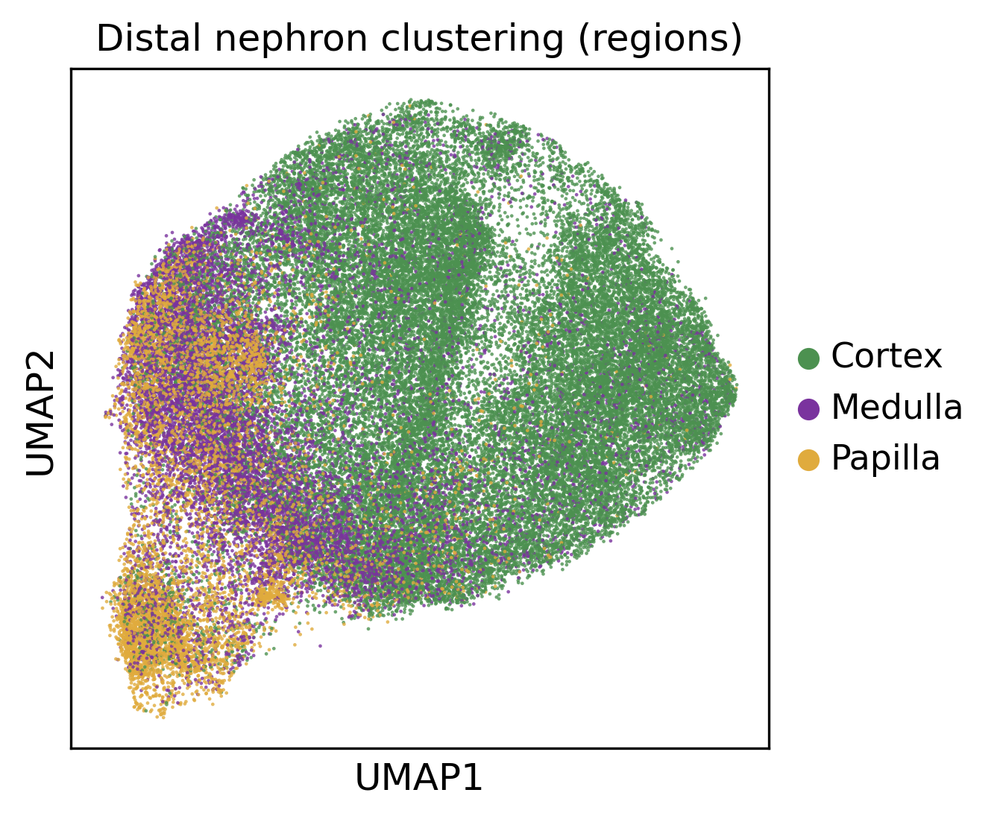

In [17]:
sc.pl.umap(adata_pc, color=['celltype_dis'],title='Distal nephron cell clustering',size=4)
sc.pl.umap(adata_pc, color=['celltype_dis'],legend_loc='on data',title='Distal nephron cell clustering',size=4)
sc.pl.umap(adata_pc, color=['renal_region_new'],title='Distal nephron clustering (regions)',size=5,alpha=0.8)

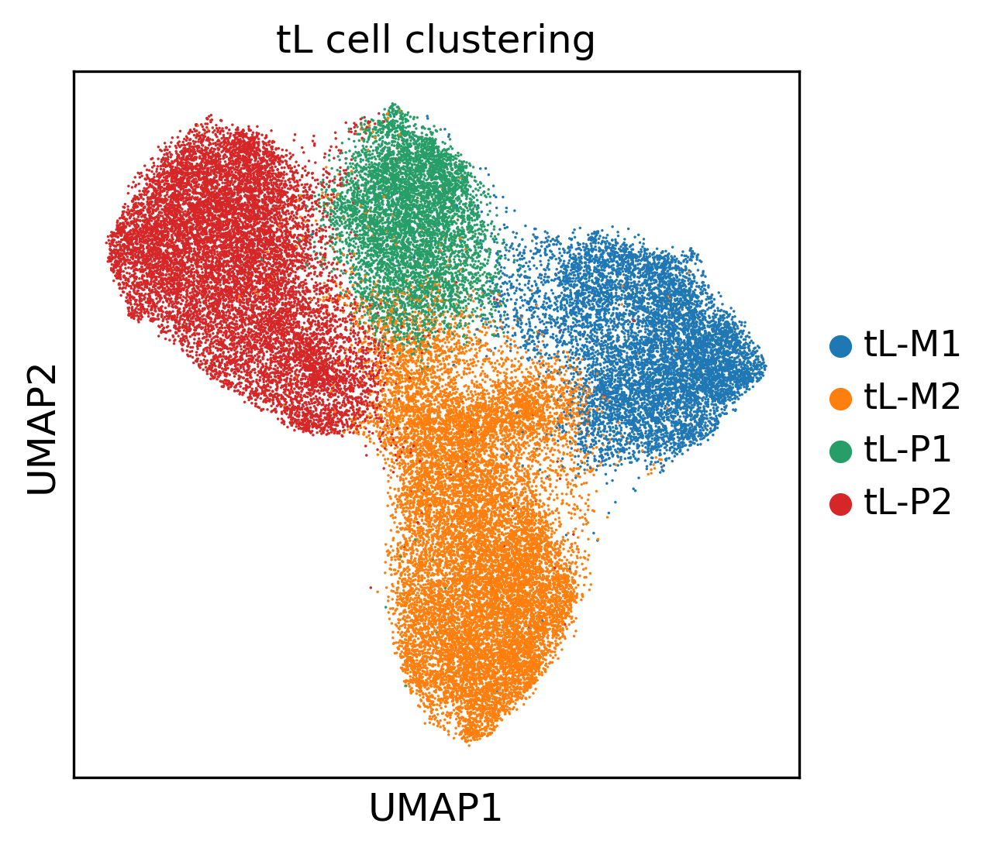

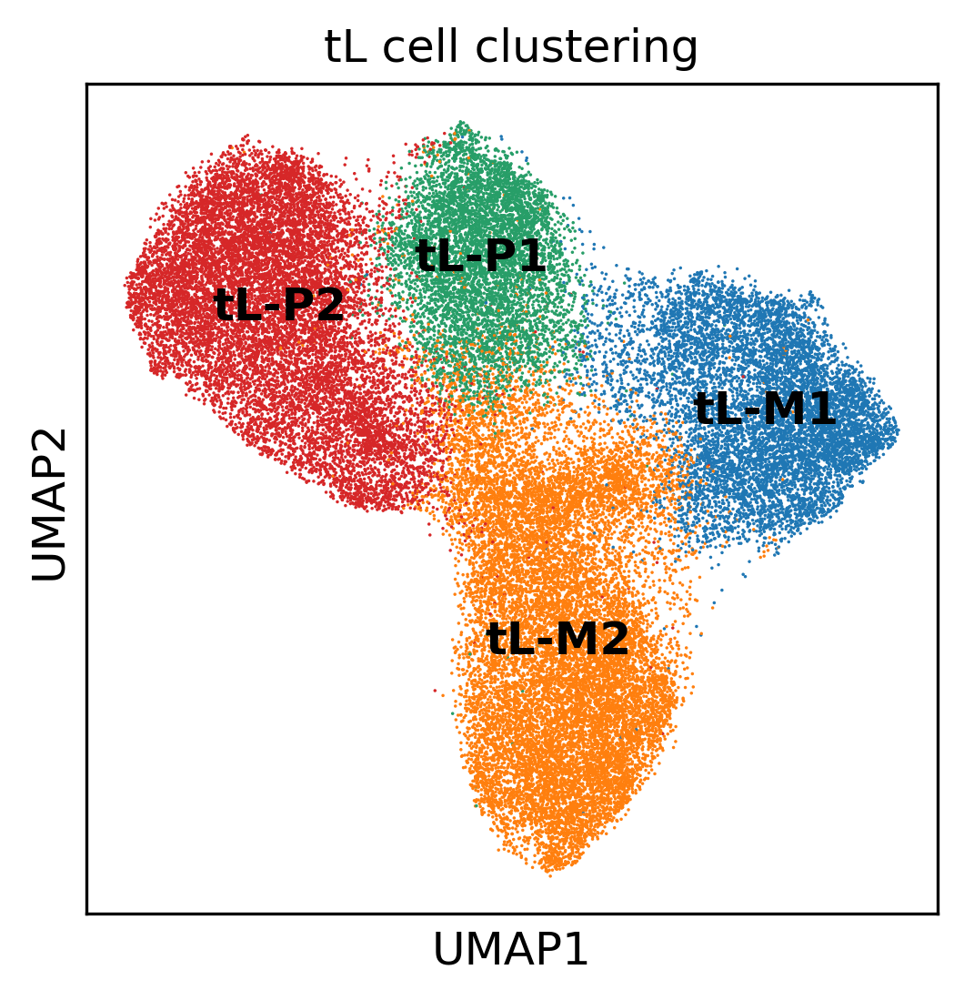

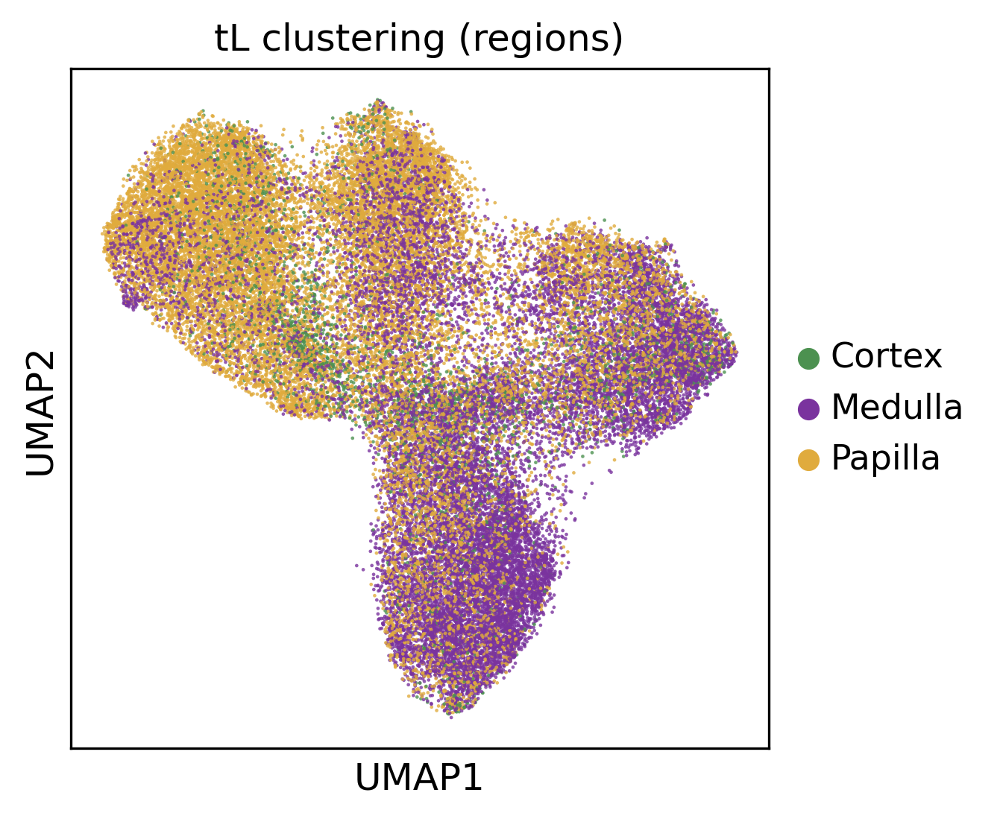

In [24]:
sc.pl.umap(adata_cod, color=['celltype_tl_2023'],title='tL cell clustering')
sc.pl.umap(adata_cod, color=['celltype_tl_2023'],legend_loc='on data',title='tL cell clustering')
sc.pl.umap(adata_cod, color=['renal_region_new'],title='tL clustering (regions)',size=5,alpha=0.8)

In [27]:
cell_order=['Cortex','Medulla','Papilla']

sample_name=['tL-M1', 'tL-M2', 'tL-P1', 'tL-P2']

dict2=pd.value_counts(adata_cod.obs['celltype_tl_2023'])

output=open('renalregion_ratio_in_celltype_tl_2023.csv','w')
output.write('sample,')
for i in cell_order:
    if i == 'Papilla':
        output.write(str(i)+'%')
    else:
        output.write(str(i)+'%,')
output.write('\n')
for i in sample_name:
    sampletype=adata_cod.obs[adata_cod.obs['celltype_tl_2023']==str(i)]
    celldict=pd.value_counts(sampletype['renal_region_new'])
    output.write(str(i)+',')
    totaln=int(dict2[i])
    for aaa in cell_order:
        if aaa == 'Papilla':
            output.write(str(float(celldict[aaa])/totaln))
        else:
            output.write(str(float(celldict[aaa])/totaln)+',')
    output.write('\n')
file=pd.read_csv('renalregion_ratio_in_celltype_tl_2023.csv', delimiter = ',',index_col=False)
file

,sample,Cortex%,Medulla%,Papilla%
0,tL-M1,0.073617,0.635265,0.291118
1,tL-M2,0.087264,0.671094,0.241643
2,tL-P1,0.035401,0.292481,0.672117
3,tL-P2,0.091889,0.124713,0.783398


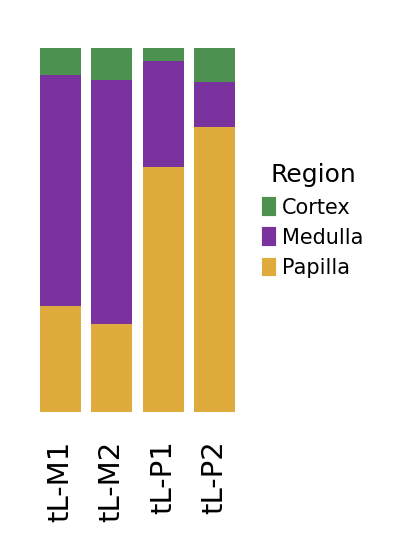

In [28]:
sc.settings.set_figure_params(dpi=100, facecolor='white',fontsize=12)
dict1={}
for i in range(len(cell_order)):
    dict1[cell_order[i]]=np.array(file.iloc[:,[i+1]].iloc[:,0])
dynamics=np.repeat(1,len(sample_name))

dict2={}
for i in dict1.keys():
    dynamics=dynamics-dict1[i]
    dict2[i]=dynamics
color_dict={}
for i in cell_order:
    ind=cell_order.index(i)
    color_dict[i]=adata_cod.uns['renal_region_new_colors'][ind]

import matplotlib.pyplot as plt 
plt.figure(dpi = 300, figsize=(1.5,2))
width =0.8
for i in range(len(cell_order)):
    celltype=cell_order[i]
    plt.bar(sample_name, dict1[celltype], width, bottom=dict2[celltype], color=color_dict[celltype])


plt.grid(False)
plt.xticks(rotation=90,fontsize=7)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    labelbottom=True) # labels along the bottom edge are off
plt.tick_params(
    axis='y',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    left=False,         # ticks along the top edge are off
labelleft=False)
#plt.ylabel('Cell Type Proportion')
for spine in plt.gca().spines.values():
    spine.set_visible(False)
    
labels = list(color_dict.keys())
handles = [plt.Rectangle((0,0),1,1, color=color_dict[label]) for label in labels]
plt.legend(handles, labels, bbox_to_anchor=(1, 0.7),fontsize=5,frameon=False,title='Region',title_fontsize=6)

plt.tight_layout()
#plt.savefig('figures/cell_ratio_dynamic_new_sample_corrected.png')
plt.show()

In [30]:
cell_order=['Cortex','Medulla','Papilla']

sample_name=['tL-TAL', 'TAL-C', 'TAL-M', 'TAL-P']

dict2=pd.value_counts(adata_tal.obs['celltype_tal_2023'])

output=open('renalregion_ratio_in_celltype_tal_2023.csv','w')
output.write('sample,')
for i in cell_order:
    if i == 'Papilla':
        output.write(str(i)+'%')
    else:
        output.write(str(i)+'%,')
output.write('\n')
for i in sample_name:
    sampletype=adata_tal.obs[adata_tal.obs['celltype_tal_2023']==str(i)]
    celldict=pd.value_counts(sampletype['renal_region_new'])
    output.write(str(i)+',')
    totaln=int(dict2[i])
    for aaa in cell_order:
        if aaa == 'Papilla':
            output.write(str(float(celldict[aaa])/totaln))
        else:
            output.write(str(float(celldict[aaa])/totaln)+',')
    output.write('\n')
file=pd.read_csv('renalregion_ratio_in_celltype_tal_2023.csv', delimiter = ',',index_col=False)
file

,sample,Cortex%,Medulla%,Papilla%
0,tL-TAL,0.200973,0.673188,0.125839
1,TAL-C,0.715181,0.246111,0.038708
2,TAL-M,0.257728,0.527330,0.214942
3,TAL-P,0.041154,0.445996,0.512850


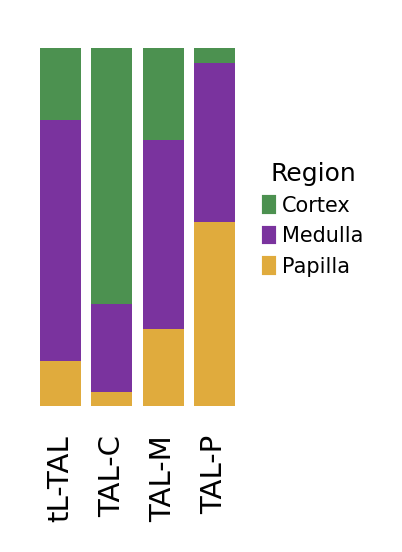

In [31]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=12)
dict1={}
for i in range(len(cell_order)):
    dict1[cell_order[i]]=np.array(file.iloc[:,[i+1]].iloc[:,0])
dynamics=np.repeat(1,len(sample_name))

dict2={}
for i in dict1.keys():
    dynamics=dynamics-dict1[i]
    dict2[i]=dynamics
color_dict={}
for i in cell_order:
    ind=cell_order.index(i)
    color_dict[i]=adata_tal.uns['renal_region_new_colors'][ind]

import matplotlib.pyplot as plt 
plt.figure(dpi = 300, figsize=(1.5,2))
width =0.8
for i in range(len(cell_order)):
    celltype=cell_order[i]
    plt.bar(sample_name, dict1[celltype], width, bottom=dict2[celltype], color=color_dict[celltype])


plt.grid(False)
plt.xticks(rotation=90,fontsize=7)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    labelbottom=True) # labels along the bottom edge are off
plt.tick_params(
    axis='y',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    left=False,         # ticks along the top edge are off
labelleft=False)
#plt.ylabel('Cell Type Proportion')
for spine in plt.gca().spines.values():
    spine.set_visible(False)
    
labels = list(color_dict.keys())
handles = [plt.Rectangle((0,0),1,1, color=color_dict[label]) for label in labels]
plt.legend(handles, labels, bbox_to_anchor=(1, 0.7),fontsize=5,frameon=False,title='Region',title_fontsize=6)

plt.tight_layout()
#plt.savefig('figures/cell_ratio_dynamic_new_sample_corrected.png')
plt.show()

In [38]:
adata_cod_2 = adata_cod[adata_cod.obs.renal_region_new != 'Cortex', :]

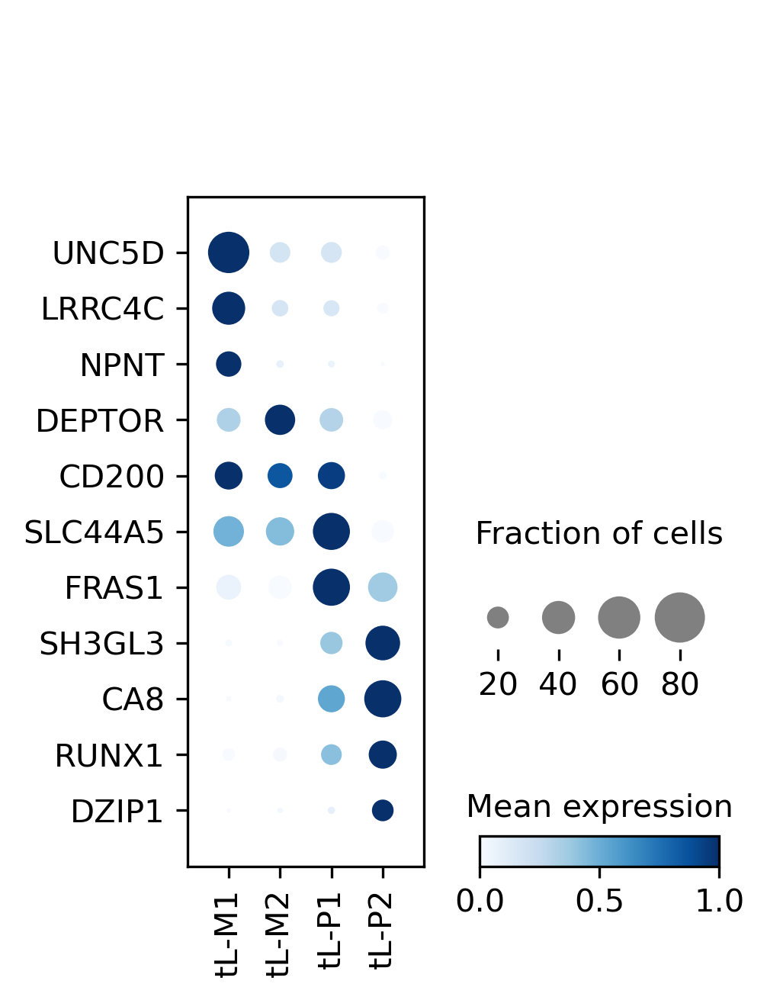

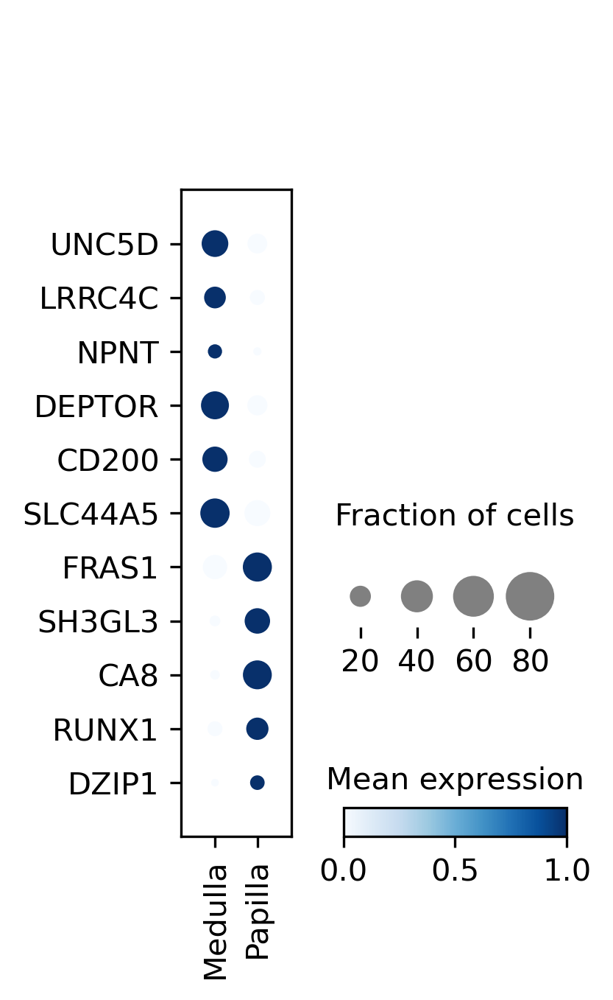

In [46]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=12)

marker_gene= ['UNC5D','LRRC4C','NPNT','DEPTOR','CD200','SLC44A5','FRAS1','SH3GL3','CA8','RUNX1','DZIP1']

sc.pl.DotPlot(adata_cod_2, marker_gene, groupby='celltype_tl_2023',
             standard_scale='var',expression_cutoff=0.75)\
.style(cmap="Blues",largest_dot=250,dot_edge_lw=0,size_exponent=1.2, dot_max=0.8)\
.legend(width=1.5,colorbar_title='Mean expression',size_title='Fraction of cells\n').swap_axes().show()
sc.pl.DotPlot(adata_cod_2, marker_gene, groupby='renal_region_new',
             standard_scale='var',expression_cutoff=0.75)\
.style(cmap="Blues",largest_dot=250,dot_edge_lw=0,size_exponent=1.2, dot_max=0.8)\
.legend(width=1.5,colorbar_title='Mean expression',size_title='Fraction of cells\n').swap_axes().show()

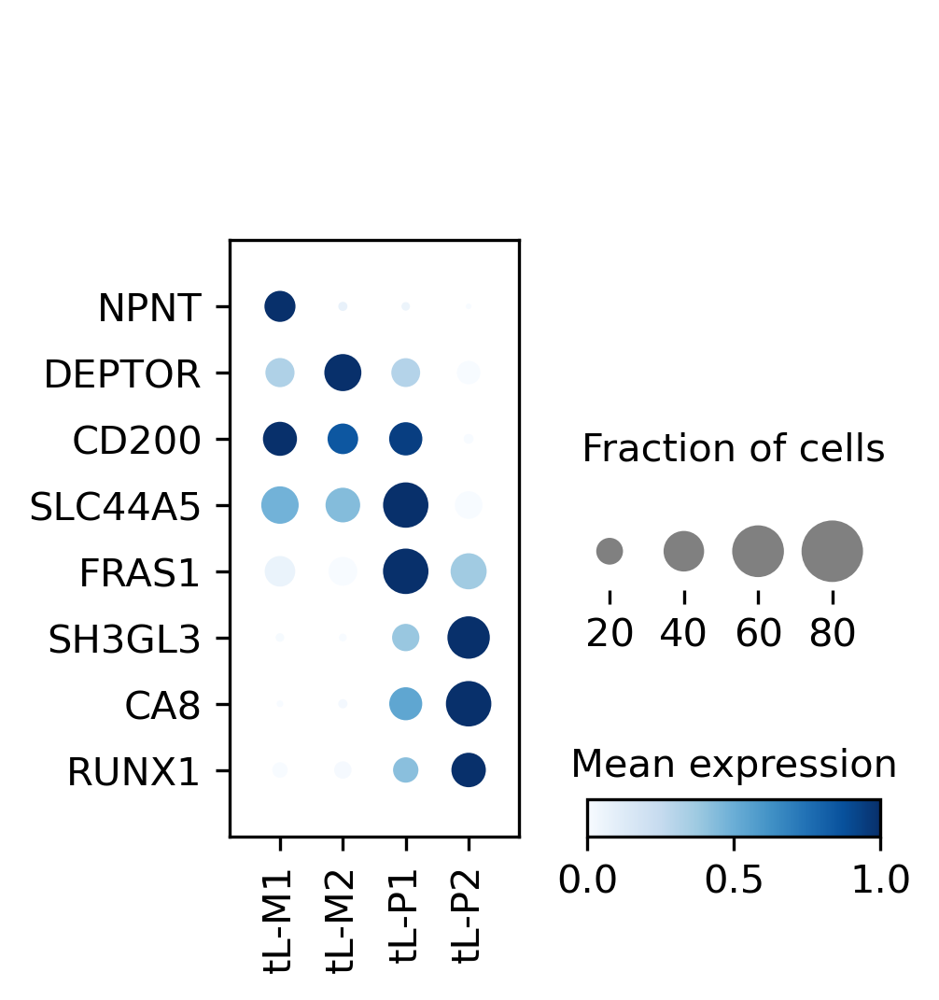

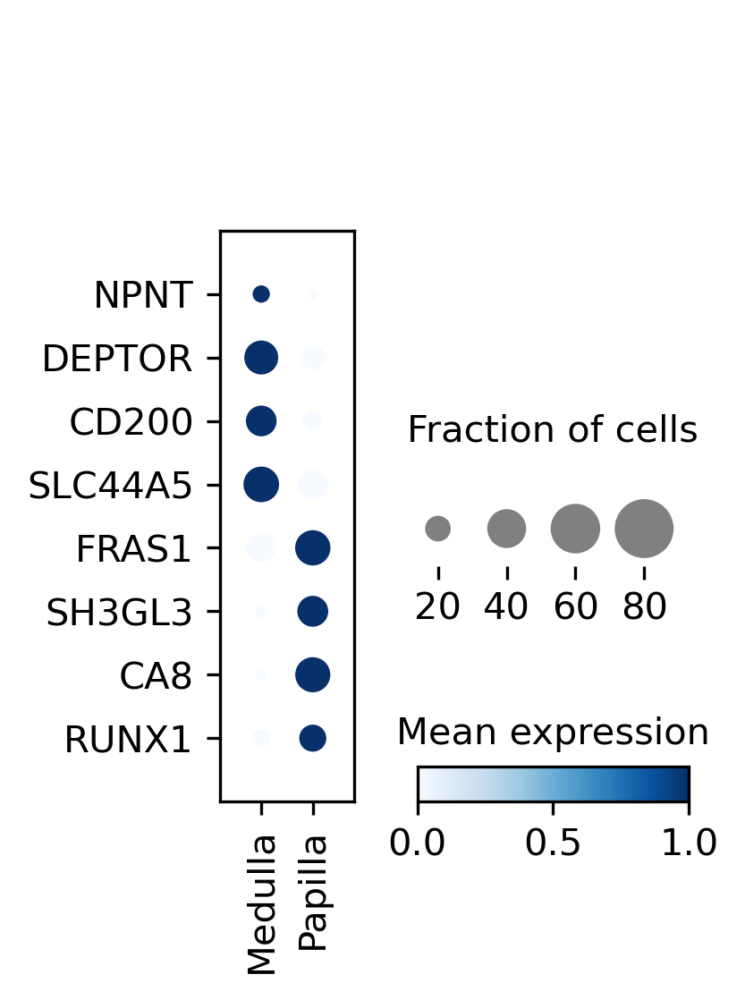

In [47]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=12)

marker_gene= ['NPNT','DEPTOR','CD200','SLC44A5','FRAS1','SH3GL3','CA8','RUNX1']

sc.pl.DotPlot(adata_cod_2, marker_gene, groupby='celltype_tl_2023',
             standard_scale='var',expression_cutoff=0.75)\
.style(cmap="Blues",largest_dot=250,dot_edge_lw=0,size_exponent=1.2, dot_max=0.8)\
.legend(width=1.5,colorbar_title='Mean expression',size_title='Fraction of cells\n').swap_axes().show()
sc.pl.DotPlot(adata_cod_2, marker_gene, groupby='renal_region_new',
             standard_scale='var',expression_cutoff=0.75)\
.style(cmap="Blues",largest_dot=250,dot_edge_lw=0,size_exponent=1.2, dot_max=0.8)\
.legend(width=1.5,colorbar_title='Mean expression',size_title='Fraction of cells\n').swap_axes().show()

In [43]:
adata_pc2=sc.read('PC_CMP.h5ad')
adata_tal2=sc.read('TAL_CMP.h5ad')

In [ ]:
adata_pc2 = adata_pc2[adata_pc2.obs.renal_region_new != 'Cortex', :]

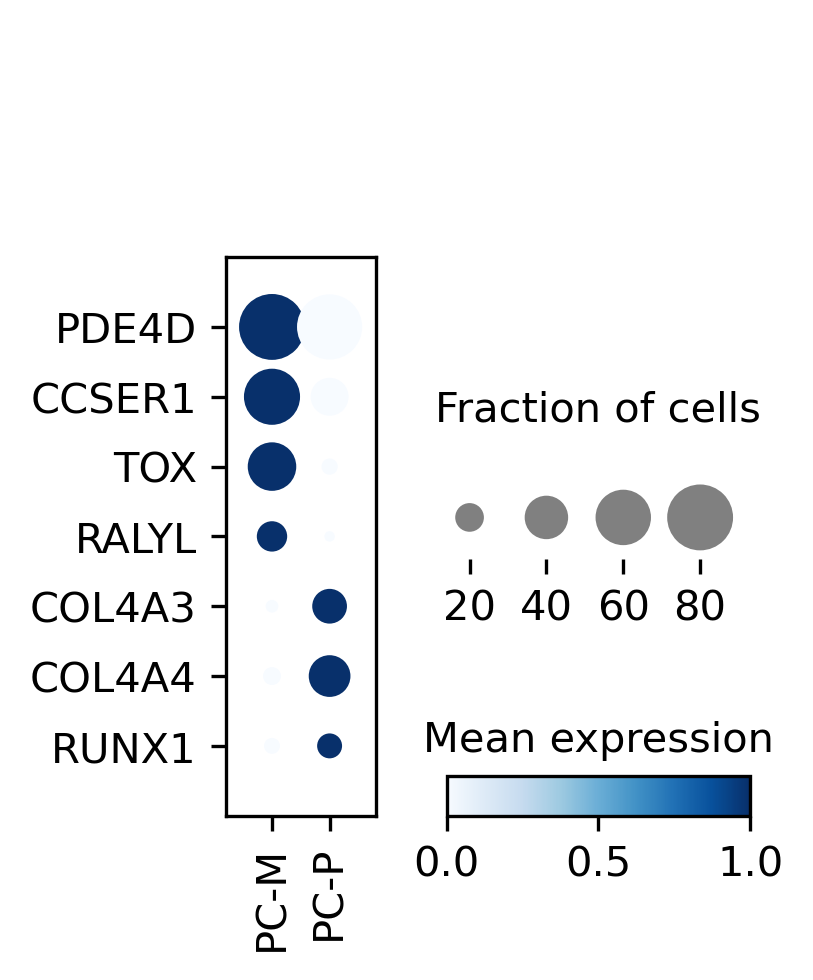

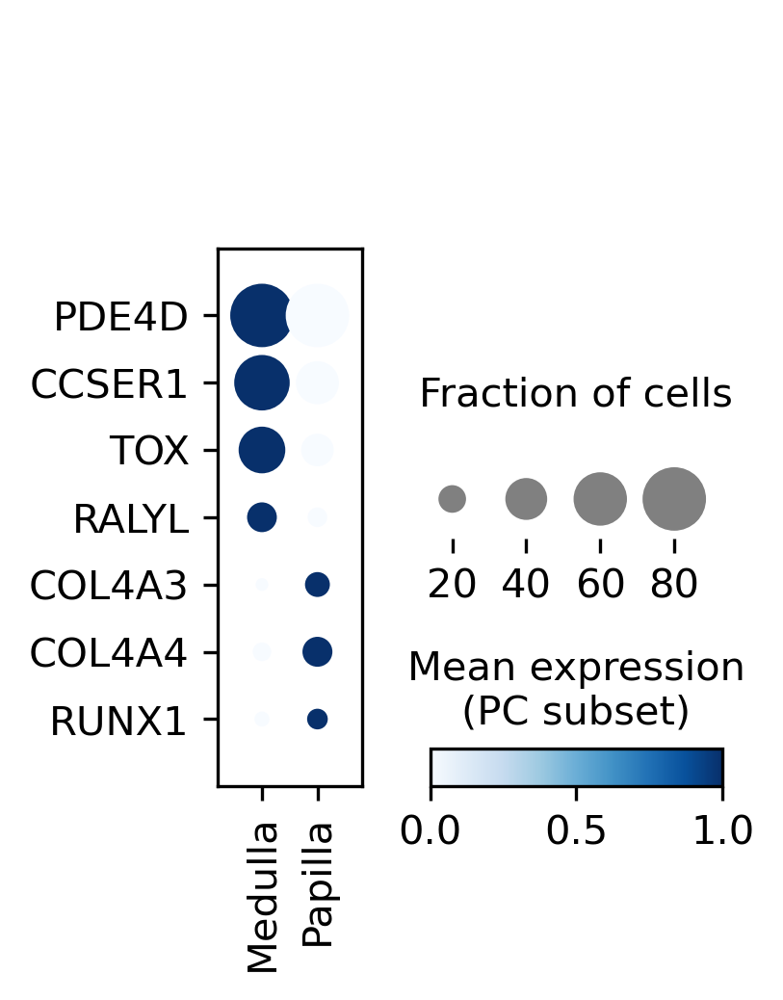

In [48]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=12)

marker_gene= ['PDE4D','CCSER1','TOX','RALYL','COL4A3','COL4A4','RUNX1']

sc.pl.DotPlot(adata_pc2, marker_gene, groupby='celltype_dis',
             standard_scale='var',expression_cutoff=0.75)\
.style(cmap="Blues",largest_dot=250,dot_edge_lw=0,size_exponent=1.2, dot_max=0.8)\
.legend(width=1.5,colorbar_title='Mean expression',size_title='Fraction of cells\n').swap_axes().show()

sc.pl.DotPlot(adata_pc2, marker_gene, groupby='renal_region_new',
             standard_scale='var',expression_cutoff=0.75)\
.style(cmap="Blues",largest_dot=250,dot_edge_lw=0,size_exponent=1.2, dot_max=0.8)\
.legend(width=1.5,colorbar_title='Mean expression\n(PC subset)',size_title='Fraction of cells\n').swap_axes().show()

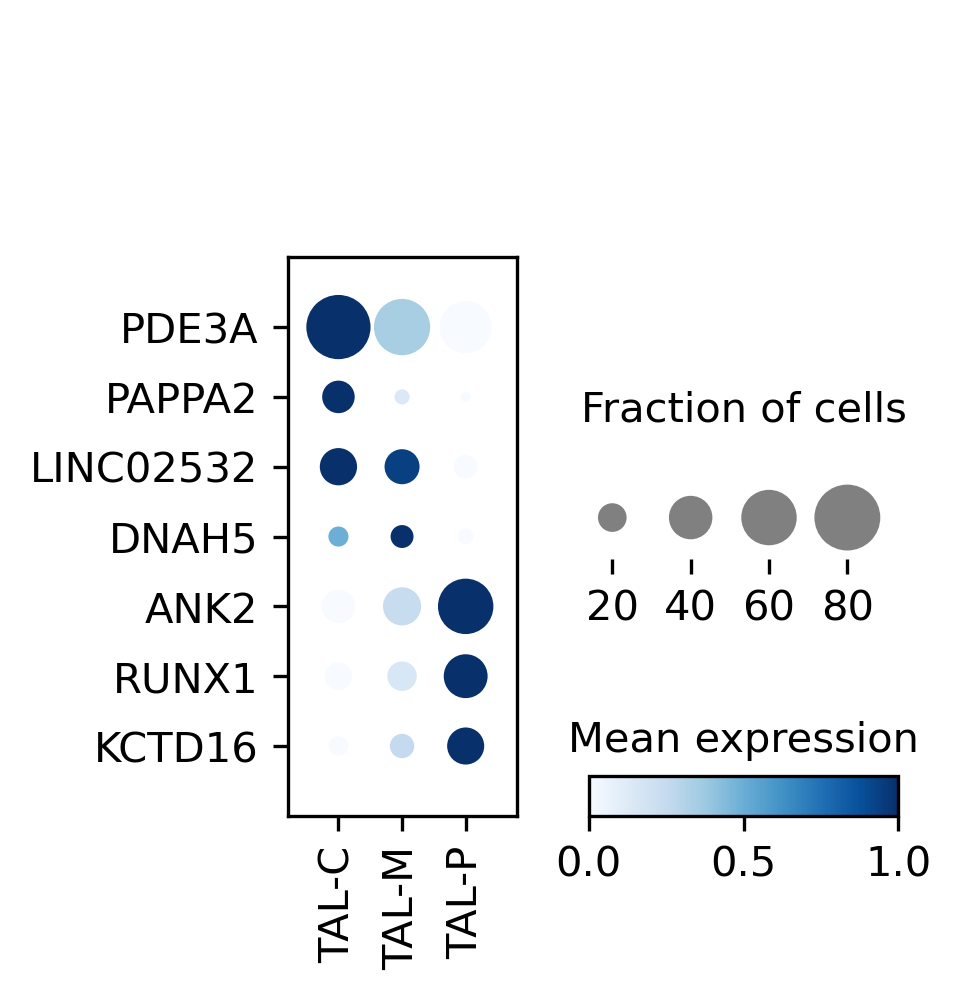

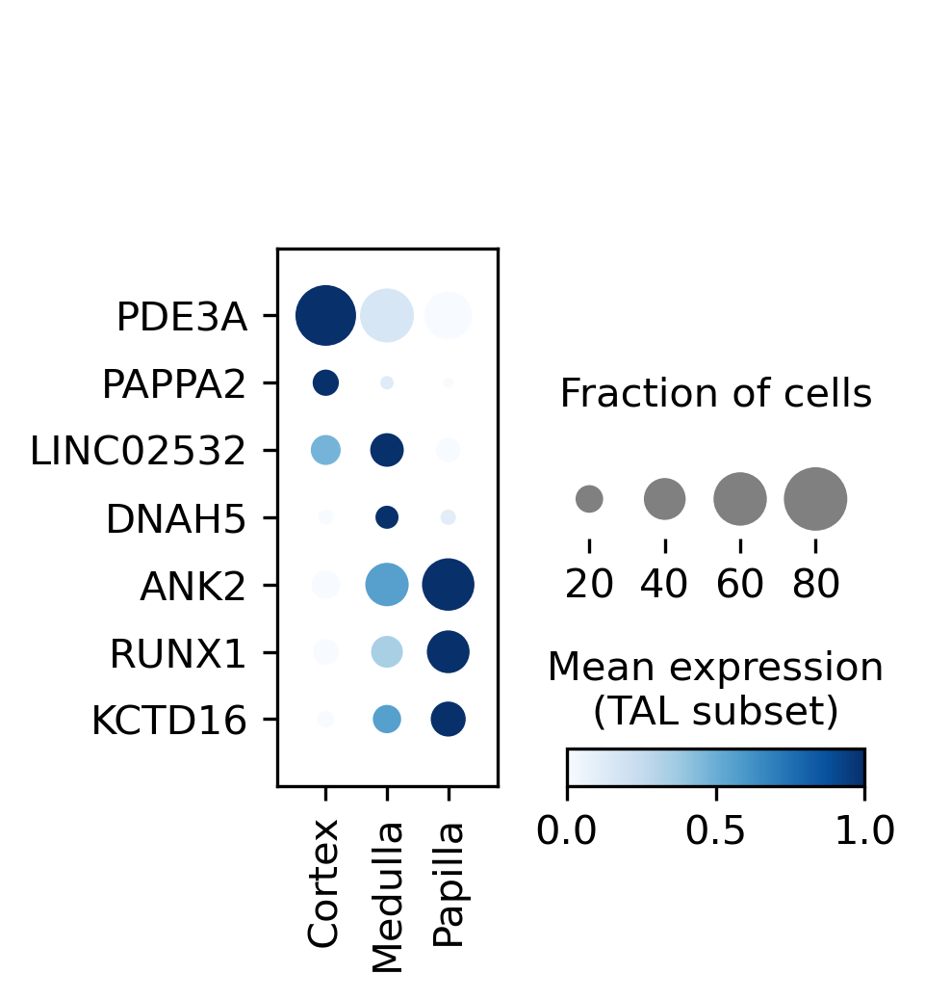

In [51]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=12)

marker_gene= ['PDE3A','PAPPA2','LINC02532','DNAH5','ANK2','RUNX1','KCTD16']

sc.pl.DotPlot(adata_tal2, marker_gene, groupby='celltype_tal',
             standard_scale='var',expression_cutoff=0.75)\
.style(cmap="Blues",largest_dot=250,dot_edge_lw=0,size_exponent=1.2, dot_max=0.8)\
.legend(width=1.5,colorbar_title='Mean expression',size_title='Fraction of cells\n').swap_axes().show()

sc.pl.DotPlot(adata_tal2, marker_gene, groupby='renal_region_new',
             standard_scale='var',expression_cutoff=0.75)\
.style(cmap="Blues",largest_dot=250,dot_edge_lw=0,size_exponent=1.2, dot_max=0.8)\
.legend(width=1.5,colorbar_title='Mean expression\n(TAL subset)',size_title='Fraction of cells\n').swap_axes().show()

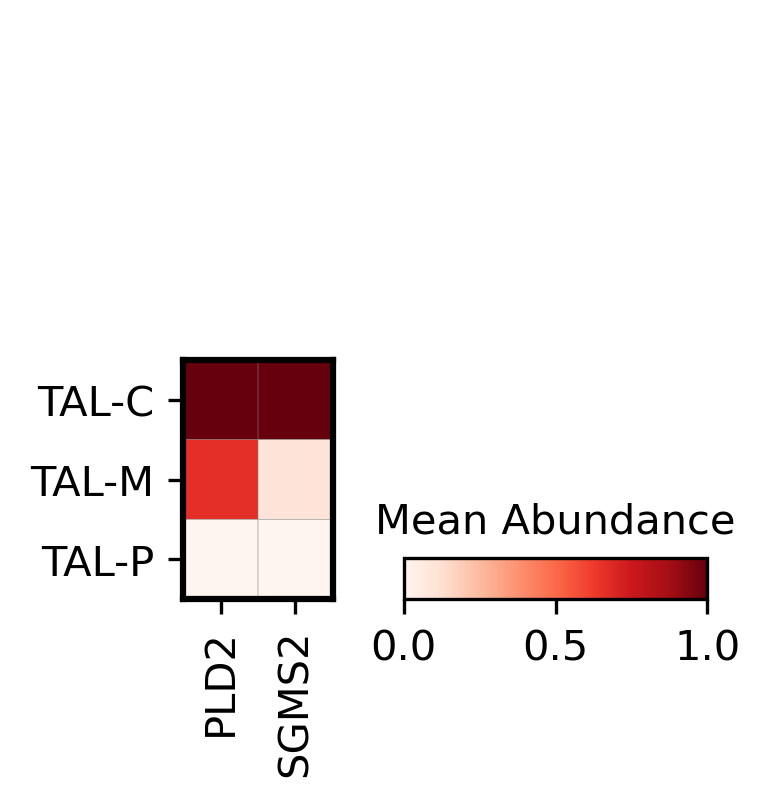

In [57]:
sc.pl.matrixplot(adata_tal2, ['PLD2','SGMS2'] ,groupby = 'celltype_tal',standard_scale='var',cmap='Reds',swap_axes=False,
                colorbar_title ='Mean Abundance')

In [3]:
from matplotlib.colors import LinearSegmentedColormap
traffic=LinearSegmentedColormap.from_list('name',["limegreen", "w", "red"], N=256)

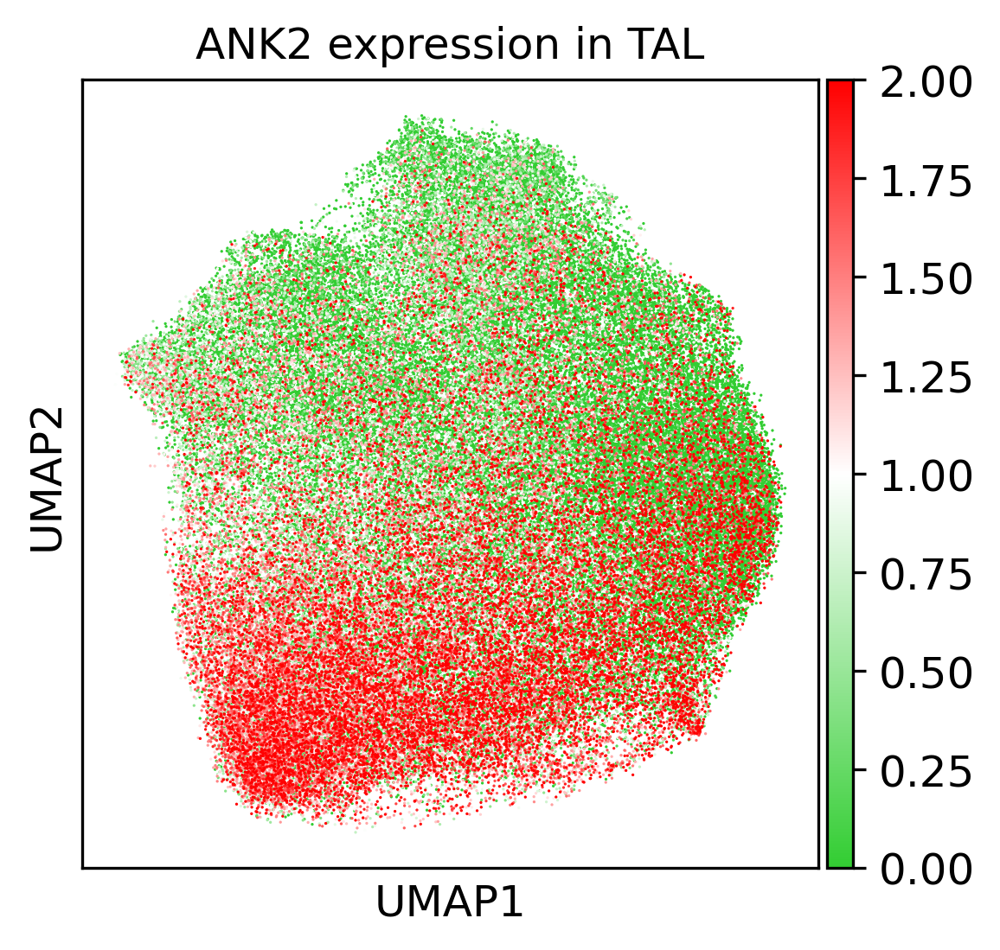

In [14]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=12)
sc.pl.umap(adata_tal, color=['ANK2'],cmap=traffic,vmax=2, size=2.5, title='ANK2 expression in TAL')